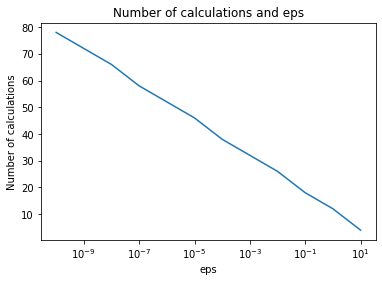

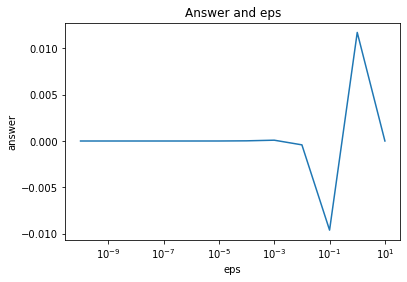

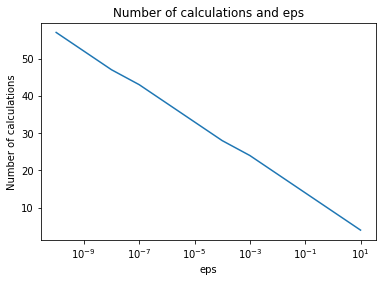

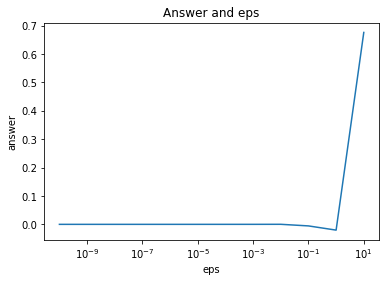

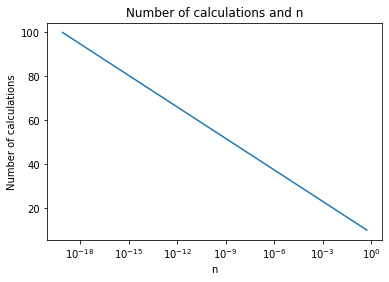

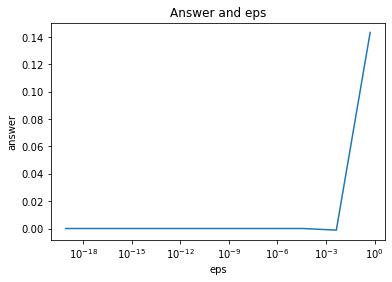

In [1]:
from typing import Callable, Tuple
import numpy as np
%run ../lab1/one_dimensional.ipynb
import datetime
import plotly.graph_objects as go

In [2]:
def search_range_with_min(f: Callable, x0: float, step=0.1, eps=1e-6) -> Tuple[float, float]:
    if f(x0) < f(x0 + step):
        step *= -1

    y0 = f(x0)
    x = x0 + step

    while f(x) < y0 + eps:
        step *= 2
        x += step

    if step > 0:
        return x0, x
    return x, x0


In [3]:
def calculate_step(f: Callable, x: float, grad: float, method, arg):
    step_f = lambda step: f(x + step * grad)
    left, right = search_range_with_min(step_f, 0)
    arg, _ = method(step_f, left, right, arg)
    return arg


In [4]:
def gradient_descent(f: Callable, f_grad: Callable, x0,  method, arg, eps=10**-4, max_iter=1e5):
    x = x0

    it = 0
    trace = [x]
    while True:
        grad = f_grad(x)

        step = calculate_step(f, x, grad, method, arg)
        next_x = x - step * grad
        trace.append(next_x)
        if abs(f(next_x) - f(x)) < eps or np.linalg.norm(grad) < eps or it >= max_iter:
            return next_x, trace

        x = next_x
        it += 1


In [5]:
def measure(f, *args):
    start_time = datetime.datetime.now()
    res, _ = f(*args)
    end_time = datetime.datetime.now()
    return res, 'Microseconds ' + str((end_time-start_time).microseconds)

In [6]:
def test_f(arg):
    return arg[0] ** 2 + (arg[1] - 1) ** 2

def test_f_grad(arg):
    return np.array([arg[0] * 2, arg[1] * 2 - 2])

print(measure(gradient_descent, test_f, test_f_grad, np.array([-10, 15]), dihotomi, 10**-4))
print(measure(gradient_descent, test_f, test_f_grad, np.array([-10, 15]), gold_sech, 10**-4))
print(measure(gradient_descent, test_f, test_f_grad, np.array([-10, 15]), fibbonachi, 17))

<ipython-input-6-56056e975969>:2: RuntimeWarning: overflow encountered in double_scalars
  return arg[0] ** 2 + (arg[1] - 1) ** 2
<ipython-input-4-cbd2d2d3cd0d>:12: RuntimeWarning: invalid value encountered in double_scalars
  if abs(f(next_x) - f(x)) < eps or np.linalg.norm(grad) < eps or it >= max_iter:


(array([-1.00813539e+154,  1.41138954e+154]), 'Microseconds 961128')
(array([-1.15676212e+154,  1.61946697e+154]), 'Microseconds 18402')
(array([-1.31681920e+154,  1.84354688e+154]), 'Microseconds 3379')


In [7]:
def analyze(f, f_grad, x_border, y_border, method, param):
    x = np.linspace(x_border[0], x_border[1], 50)
    y = np.linspace(y_border[0], y_border[1], 50)
    z = np.vectorize(lambda x, y: f(np.array([x, y])))(*np.meshgrid(x, y))

    fig = go.Figure()
    fig.add_trace(
        go.Contour(
            x=x, y=y,
            z=z,
            contours_coloring='lines',
            line_width=2
        ))
    
    _, trace = gradient_descent(
        f, f_grad,
        np.array([-3, -3]),
        method,
        param
    )
    
    xy = trace
    print(f'step count = {len(xy)}')
    fig.add_trace(
        go.Scatter(
            x=[p[0] for p in xy], 
            y=[p[1] for p in xy],
        )
    )
    
    fig.show()

In [8]:
analyze(test_f, test_f_grad, np.array([-3,3]), np.array([-3,3]), dihotomi, 10**-4)

<ipython-input-6-56056e975969>:2: RuntimeWarning:

overflow encountered in double_scalars

<ipython-input-4-cbd2d2d3cd0d>:12: RuntimeWarning:

invalid value encountered in double_scalars



step count = 100002


In [9]:
def rosenbrock_f(arg):
    x = arg[0]
    y = arg[1]
    return 100 * ((y - x ** 2) ** 2) + ((1. - x) ** 2)

def rosenbrock_grad(arg):
    x = arg[0]
    y = arg[1]
    dx = 2 * (200 * (x ** 3) - 200 * x * y + x - 1)
    dy = 200 * (y - (x ** 2))
    return np.array([dx, dy])

analyze(rosenbrock_f, rosenbrock_grad, np.array([-10,20]), np.array([-10,20]), gold_sech, 10**-4)

<ipython-input-9-8f023ebbd63f>:4: RuntimeWarning:

overflow encountered in double_scalars

<ipython-input-9-8f023ebbd63f>:9: RuntimeWarning:

overflow encountered in double_scalars

<ipython-input-9-8f023ebbd63f>:10: RuntimeWarning:

overflow encountered in double_scalars

<ipython-input-3-8b0cb2f4ac7e>:2: RuntimeWarning:

invalid value encountered in multiply

<ipython-input-9-8f023ebbd63f>:4: RuntimeWarning:

invalid value encountered in double_scalars

<ipython-input-9-8f023ebbd63f>:9: RuntimeWarning:

invalid value encountered in double_scalars

<ipython-input-9-8f023ebbd63f>:10: RuntimeWarning:

invalid value encountered in double_scalars



KeyboardInterrupt: 